In [1]:
import pandas as pd
import tangos
import tangos.examples.mergers as mergers

import numpy as np
import h5py
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
h = 0.6776942783267969

from tangos_halo_module.halo_properties import get_main_progenitor_branch, track_halo_property, get_timesteps, ID_to_sim_halo_snap, infall_final_n_particles, infall_final_coordinates, apocentric_distance, disruption_time, accretion_time, orbit_interpolation, infall_velocity, quenching_time, max_sSFR_time, max_mass_time 
from tangos_halo_module.path import get_file_path, get_halo_snap_num, read_file
from tangos_halo_module.halos import ID_to_tangos_halo, get_survivors, get_zombies, get_host, get_survivor_IDs, get_zombie_IDs, blockPrint, enablePrint, tangos_to_pynbody_halo
from tangos_halo_module.new import get_mass_profiles
pd.set_option("display.max_rows", None, "display.max_columns", None)

/home/pathakde/anaconda3/envs/conda-env-py3/lib/python3.6/site-packages/ipykernel_launcher.py:92: RuntimeWarning: invalid value encountered in true_divide
/home/pathakde/anaconda3/envs/conda-env-py3/lib/python3.6/site-packages/ipykernel_launcher.py:92: RuntimeWarning: invalid value encountered in true_divide


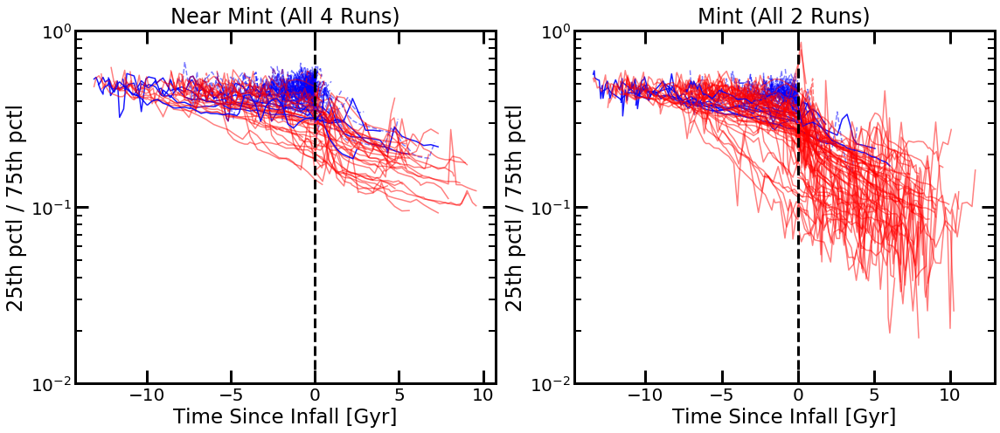

In [10]:
data=pd.read_csv('Data100.csv')
ids=data['ID'].to_numpy()
status=data['Status'].to_numpy()
t_infall=data['time_infall'].to_numpy()
t_quench = data['time_quench'].to_numpy()
Mstar_infall = data['infall_mass'].to_numpy()
log_Mstar_infall = np.log10(Mstar_infall)
 
fig, (ax1, ax2) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(16, 7))
# (ax1, ax2) = ax
fig.set_facecolor('w')
# fig.set_dpi(150.0)
np.seterr(divide='ignore')

linx=np.linspace(0, 14, 100)
cm = plt.cm.get_cmap('viridis')
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)
plt.setp(ax2.spines.values(), linewidth=3)
# fig.set_dpi(150)
infall_Mstar = data['infall_mass'].to_numpy()
for idx in ids[status=='Zombie']:
    t_in=t_infall[ids==idx]
    t_qn=t_quench[ids==idx]
    t, profile=get_mass_profiles(ID=idx, ptcl='D', resolution=100)
    t=np.array([float(round(tx, 3)) for tx in t])
    pctl25=profile[:,1]
    profile_in=pctl25[t==np.round(t_in, 3)]
#     print(t, t_in, profile_in, profile[:,1])
    ratio=profile[:,1]/profile[:,3]
    if t_qn>0:
        ax1.plot(t[ratio<1]-t_in, ratio[ratio<1], c='r', ls='--', alpha=0.5)
    else:
        ax1.plot(t[ratio<1]-t_in, ratio[ratio<1], c='b', ls='--', alpha=0.5)
for idx in ids[status=='Survivor']:
    t_in=t_infall[ids==idx]
    t_qn=t_quench[ids==idx]
    t, profile=get_mass_profiles(ID=idx, ptcl='D', resolution=100)
    t=np.array([float(round(tx, 3)) for tx in t])
    pctl25=profile[:,1]
    profile_in=pctl25[t==np.round(t_in, 3)]
#     print(t, t_in, profile_in, profile[:,1])
    ratio=profile[:,1]/profile[:,3]
    if t_qn>0:
        ax1.plot(t[ratio<1]-t_in, ratio[ratio<1], c='r', ls='-', alpha=0.5)
    else:
        ax1.plot(t[ratio<1]-t_in, ratio[ratio<1], c='b', ls='-', alpha=0.9)

ax1.axhline(1, ls='--', lw=1, c='k')
ax1.axvline(0, ls='--', lw=3, c='k')
# ax1.set_xlim(0, 14)
ax1.set_ylim(1e-2, 1e0)
ax1.set_yscale('log')
# ax1.legend(loc='lower right', fontsize=20, frameon=True, framealpha=0.4)
ax1.tick_params(which='major', length=15, width=3, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax1.set_title('Near Mint (All 4 Runs)', fontsize=24, pad=10)
ax1.set_xlabel('Time Since Infall [Gyr]', fontsize=23)
ax1.set_ylabel('25th pctl / 75th pctl', fontsize=24)


data=pd.read_csv('Mint_Data/Data100.csv')
ids=data['ID'].to_numpy()
status=data['Status'].to_numpy()
t_infall=data['time_infall'].to_numpy()
t_quench = data['time_quench'].to_numpy()
Mstar_infall = data['infall_mass'].to_numpy()
log_Mstar_infall = np.log10(Mstar_infall)

for idx in ids[status=='Zombie']:
    t_in=t_infall[ids==idx]
    t_qn=t_quench[ids==idx]
    t, profile=get_mass_profiles(ID=idx, ptcl='D', resolution='Mint')
    t=np.array([float(round(tx, 3)) for tx in t])
    pctl25=profile[:,1]
    profile_in=pctl25[t==np.round(t_in, 3)]
#     print(t, t_in, profile_in, profile[:,1])
    ratio=profile[:,1]/profile[:,3]
    if t_qn>0:
        ax2.plot(t[ratio<1]-t_in, ratio[ratio<1], c='r', ls='--', alpha=0.5)
    else:
        ax2.plot(t[ratio<1]-t_in, ratio[ratio<1], c='b', ls='--', alpha=0.5)
for idx in ids[status=='Survivor']:
    t_in=t_infall[ids==idx]
    t_qn=t_quench[ids==idx]
    t, profile=get_mass_profiles(ID=idx, ptcl='D', resolution='Mint')
    t=np.array([float(round(tx, 3)) for tx in t])
    pctl25=profile[:,1]
    profile_in=pctl25[t==np.round(t_in, 3)]
#     print(t, t_in, profile_in, profile[:,1])
    ratio=profile[:,1]/profile[:,3]
    if t_qn>0:
        ax2.plot(t[ratio<1]-t_in, ratio[ratio<1], c='r', ls='-', alpha=0.5)
    else:
        ax2.plot(t[ratio<1]-t_in, ratio[ratio<1], c='b', ls='-', alpha=0.9)
    
ax2.axhline(1, ls='--', lw=1, c='k')
ax2.axvline(0, ls='--', lw=3, c='k')
# ax1.set_xlim(0, 14)
ax2.set_ylim(1e-2, 1e0)
ax2.set_yscale('log')
# ax1.legend(loc='lower right', fontsize=20, frameon=True, framealpha=0.4)
ax2.tick_params(which='major', length=15, width=3, labelsize=15)
ax2.tick_params(which='minor', length=8, width=2, labelsize=15)
ax2.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax2.set_title('Mint (All 2 Runs)', fontsize=24, pad=10)
ax2.set_xlabel('Time Since Infall [Gyr]', fontsize=23)
ax2.set_ylabel('25th pctl / 75th pctl', fontsize=24)

#Separate into rows for each mass bin <6, 6<=x<8, 8<= ??

fig.tight_layout()

/home/pathakde/anaconda3/envs/conda-env-py3/lib/python3.6/site-packages/ipykernel_launcher.py:50: RuntimeWarning: invalid value encountered in true_divide
/home/pathakde/anaconda3/envs/conda-env-py3/lib/python3.6/site-packages/ipykernel_launcher.py:50: RuntimeWarning: invalid value encountered in true_divide


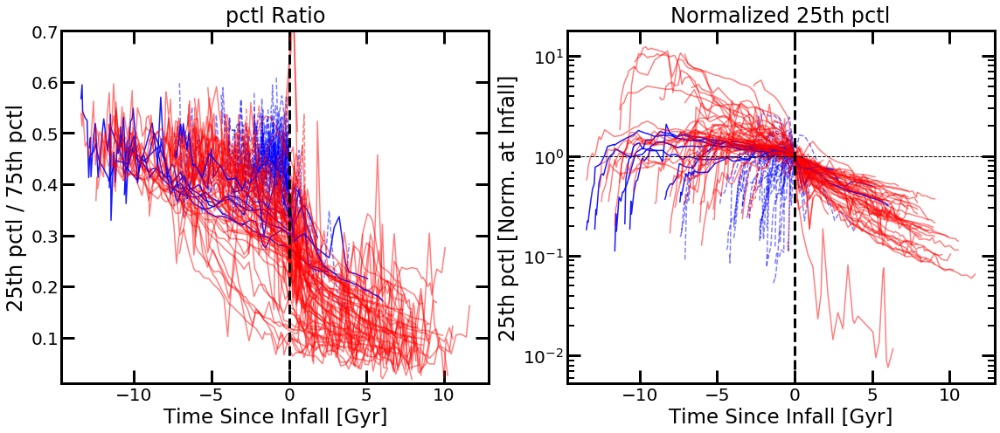

In [7]:
data=pd.read_csv('Data100.csv')
ids=data['ID'].to_numpy()
status=data['Status'].to_numpy()
t_infall=data['time_infall'].to_numpy()
t_quench = data['time_quench'].to_numpy()
Mstar_infall = data['infall_mass'].to_numpy()
log_Mstar_infall = np.log10(Mstar_infall)
 
fig, (ax1, ax2) = plt.subplots(1, 2, sharex='none', sharey='none', figsize=(16, 7))
# (ax1, ax2) = ax
fig.set_facecolor('w')
# fig.set_dpi(150.0)
np.seterr(divide='ignore')

linx=np.linspace(0, 14, 100)
cm = plt.cm.get_cmap('viridis')
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)
plt.setp(ax2.spines.values(), linewidth=3)
# fig.set_dpi(150)
data=pd.read_csv('Mint_Data/Data100.csv')
ids=data['ID'].to_numpy()
status=data['Status'].to_numpy()
t_infall=data['time_infall'].to_numpy()
t_quench = data['time_quench'].to_numpy()
Mstar_infall = data['infall_mass'].to_numpy()
log_Mstar_infall = np.log10(Mstar_infall)

for idx in ids[status=='Zombie']:
    t_in=t_infall[ids==idx]
    t_qn=t_quench[ids==idx]
    t, profile=get_mass_profiles(ID=idx, ptcl='D', resolution='Mint')
    t=np.array([float(round(tx, 3)) for tx in t])
    pctl25=profile[:,1]
    profile_in=pctl25[t==np.round(t_in, 3)]
#     print(t, t_in, profile_in, profile[:,1])
    ratio=profile[:,1]/profile[:,3]
    if t_qn>0:
        ax1.plot(t[ratio<1]-t_in, ratio[ratio<1], c='r', ls='--', alpha=0.5)
    else:
        ax1.plot(t[ratio<1]-t_in, ratio[ratio<1], c='b', ls='--', alpha=0.5)
for idx in ids[status=='Survivor']:
    t_in=t_infall[ids==idx]
    t_qn=t_quench[ids==idx]
    t, profile=get_mass_profiles(ID=idx, ptcl='D', resolution='Mint')
    t=np.array([float(round(tx, 3)) for tx in t])
    pctl25=profile[:,1]
    profile_in=pctl25[t==np.round(t_in, 3)]
#     print(t, t_in, profile_in, profile[:,1])
    ratio=profile[:,1]/profile[:,3]
    if t_qn>0:
        ax1.plot(t[ratio<1]-t_in, ratio[ratio<1], c='r', ls='-', alpha=0.5)
    else:
        ax1.plot(t[ratio<1]-t_in, ratio[ratio<1], c='b', ls='-', alpha=0.9)
    
ax1.axhline(1, ls='--', lw=1, c='k')
ax1.axvline(0, ls='--', lw=3, c='k')
# ax1.set_xlim(0, 14)
ax1.set_ylim(1e-2, 0.7)
# ax1.set_yscale('log')
# ax1.legend(loc='lower right', fontsize=20, frameon=True, framealpha=0.4)
ax1.tick_params(which='major', length=15, width=3, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax1.set_title('pctl Ratio', fontsize=24, pad=10)
ax1.set_xlabel('Time Since Infall [Gyr]', fontsize=23)
ax1.set_ylabel('25th pctl / 75th pctl', fontsize=24)


data=pd.read_csv('Mint_Data/Data100.csv')
ids=data['ID'].to_numpy()
status=data['Status'].to_numpy()
t_infall=data['time_infall'].to_numpy()
t_quench = data['time_quench'].to_numpy()
Mstar_infall = data['infall_mass'].to_numpy()
log_Mstar_infall = np.log10(Mstar_infall)

for idx in ids[status=='Zombie']:
    t_in=t_infall[ids==idx]
    t_qn=t_quench[ids==idx]
    t, profile=get_mass_profiles(ID=idx, ptcl='D', resolution='Mint')
    t=np.array([float(round(tx, 3)) for tx in t])
    pctl25=profile[:,1]
    profile_in=pctl25[t==np.round(t_in, 3)]
#     print(t, t_in, profile_in, profile[:,1])
    ratio=profile[:,1]/(profile_in)#*50000#/(profile_in)#profile[:,1]/profile[:,3]
    if t_qn>0:
        ax2.plot(t[ratio>0]-t_in, ratio[ratio>0], c='r', ls='--', alpha=0.5)
    else:
        ax2.plot(t[ratio>0]-t_in, ratio[ratio>0], c='b', ls='--', alpha=0.5)
for idx in ids[status=='Survivor']:
    t_in=t_infall[ids==idx]
    t_qn=t_quench[ids==idx]
    t, profile=get_mass_profiles(ID=idx, ptcl='D', resolution='Mint')
    t=np.array([float(round(tx, 3)) for tx in t])
    pctl25=profile[:,1]
    profile_in=pctl25[t==np.round(t_in, 3)]
#     print(t, t_in, profile_in, profile[:,1])
    ratio=profile[:,1]/(profile_in)#*50000#/(profile_in)#profile[:,1]/profile[:,3]
    if t_qn>0:
        ax2.plot(t[ratio>0]-t_in, ratio[ratio>0], c='r', ls='-', alpha=0.5)
    else:
        ax2.plot(t[ratio>0]-t_in, ratio[ratio>0], c='b', ls='-', alpha=0.9)
    
ax2.axhline(1, ls='--', lw=1, c='k')
ax2.axvline(0, ls='--', lw=3, c='k')
# ax1.set_xlim(0, 14)
# ax2.set_ylim(0.1, 100)
ax2.set_yscale('log')
# ax1.legend(loc='lower right', fontsize=20, frameon=True, framealpha=0.4)
ax2.tick_params(which='major', length=15, width=3, labelsize=15)
ax2.tick_params(which='minor', length=8, width=2, labelsize=15)
ax2.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax2.set_title('Normalized 25th pctl', fontsize=24, pad=10)
ax2.set_xlabel('Time Since Infall [Gyr]', fontsize=23)
ax2.set_ylabel('25th pctl [Norm. at Infall]', fontsize=24)

#Separate into rows for each mass bin <6, 6<=x<8, 8<= ??

fig.tight_layout()

In [14]:
profile_in=pctl25[t==np.round(t_in, 3)]
profile_in

array([0.00012197])

In [15]:
float(round(t_in[0], 3))

4.75

/home/pathakde/anaconda3/envs/conda-env-py3/lib/python3.6/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
/home/pathakde/anaconda3/envs/conda-env-py3/lib/python3.6/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide


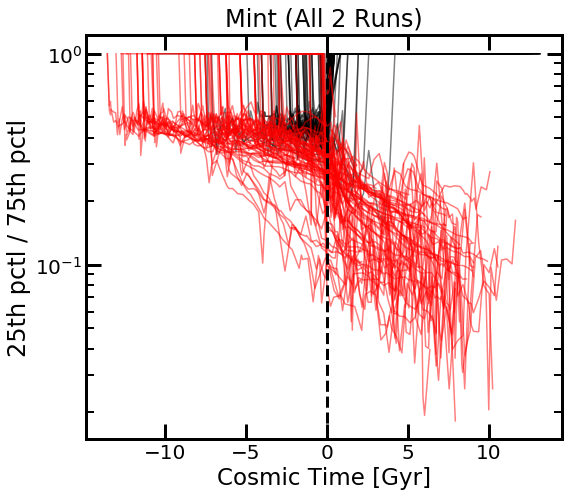

In [16]:
data=pd.read_csv('Mint_Data/Data100.csv')
ids=data['ID'].to_numpy()
status=data['Status'].to_numpy()
t_infall=data['time_infall'].to_numpy()
 
fig, ax1 = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(8, 7))
# (ax1, ax2) = ax
fig.set_facecolor('w')
# fig.set_dpi(150.0)
np.seterr(divide='ignore')

linx=np.linspace(0, 14, 100)
cm = plt.cm.get_cmap('viridis')
# Increase weight of axes
plt.setp(ax1.spines.values(), linewidth=3)
# plt.setp(ax2.spines.values(), linewidth=3)
# fig.set_dpi(150)
for idx in ids[status=='Zombie']:
    t_in=t_infall[ids==idx]
    t, profile=get_mass_profiles(ID=idx, ptcl='D', resolution='Mint')
    ratio=profile[:,1]/profile[:,3]
    ax1.plot(t[ratio>0]-t_in, ratio[ratio>0], c='k', alpha=0.5)
for idx in ids[status=='Survivor']:
    t_in=t_infall[ids==idx]
    t, profile=get_mass_profiles(ID=idx, ptcl='D', resolution='Mint')
    ratio=profile[:,1]/profile[:,3]
    ax1.plot(t[ratio>0]-t_in, ratio[ratio>0], c='r', alpha=0.5)

ax1.axvline(0, ls='--', lw=3, c='k')
# ax1.set_xlim(0, 14)
# ax1.set_ylim(0, 1)
ax1.set_yscale('log')
# ax1.legend(loc='lower right', fontsize=20, frameon=True, framealpha=0.4)
ax1.tick_params(which='major', length=15, width=3, labelsize=15)
ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
ax1.set_title('Mint (All 2 Runs)', fontsize=24, pad=10)
ax1.set_xlabel('Cosmic Time [Gyr]', fontsize=23)
ax1.set_ylabel('25th pctl / 75th pctl', fontsize=24)

fig.tight_layout()

/home/pathakde/anaconda3/envs/conda-env-py3/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


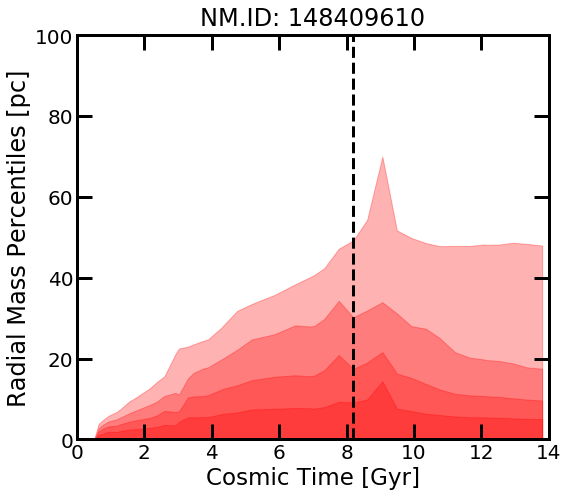

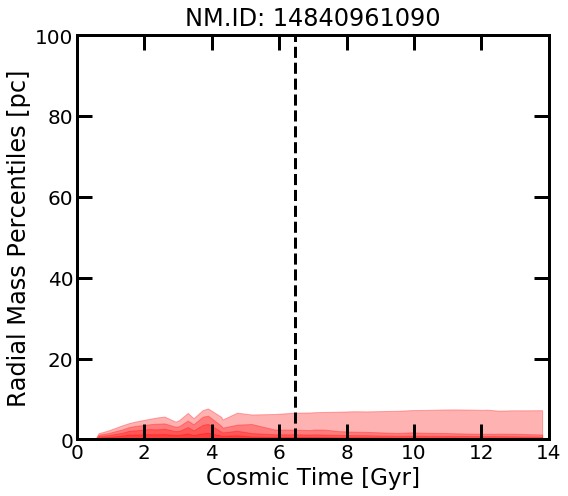

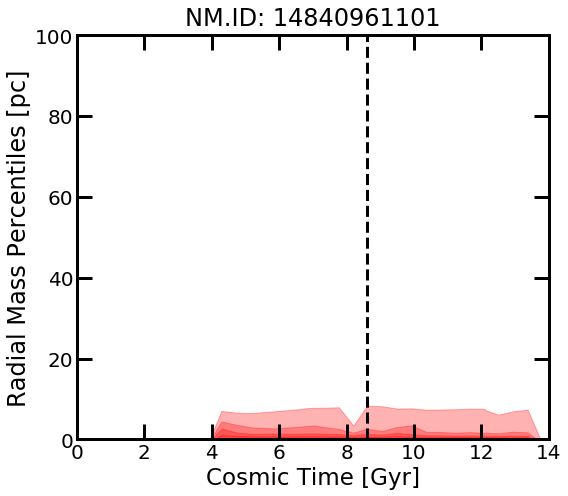

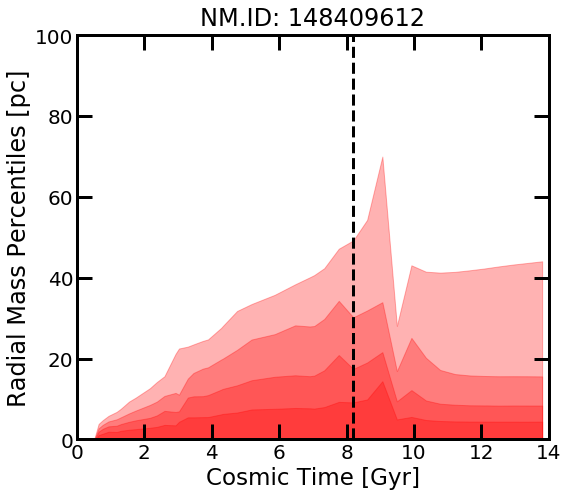

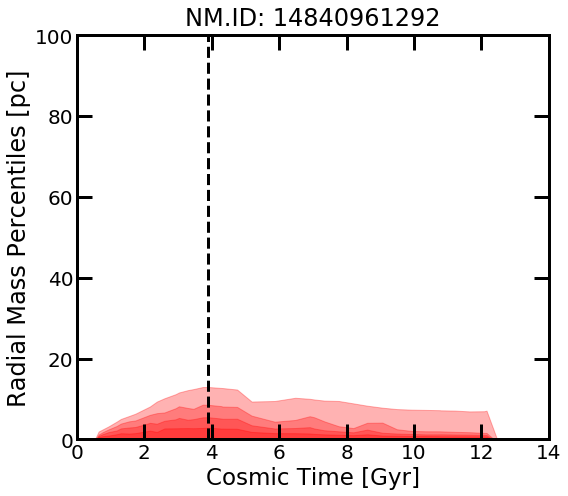

...

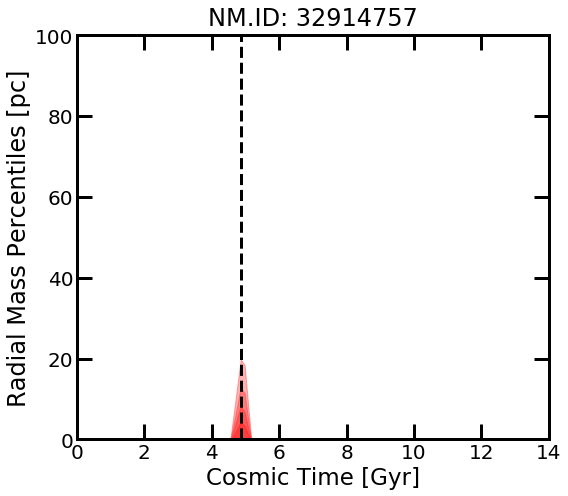

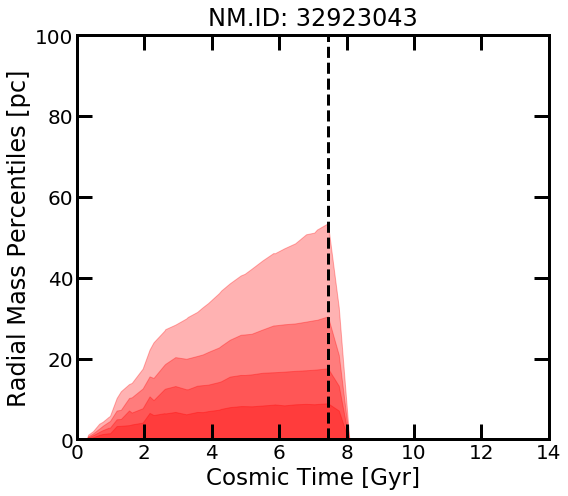

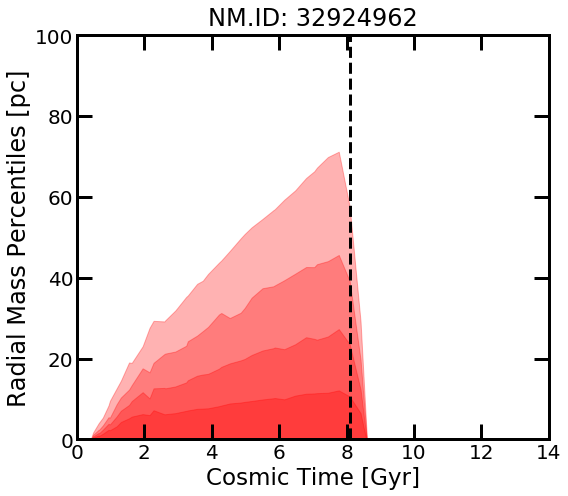

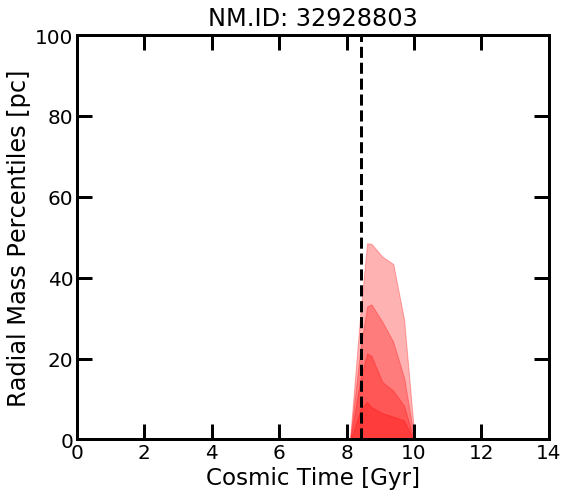

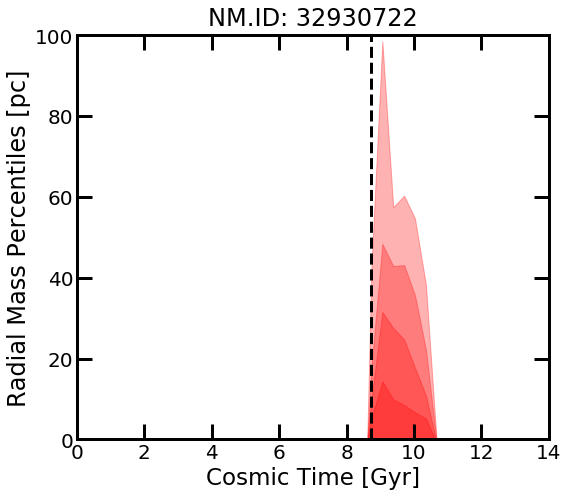

In [10]:
data=pd.read_csv('Data100.csv')
ids=data['ID'].to_numpy()
t_infall=data['time_infall'].to_numpy()

for idx in ids:
    t, profile=get_mass_profiles(ID=idx, ptcl='D', resolution=100)
    
    fig, ax1 = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(8, 7))
    # (ax1, ax2) = ax
    fig.set_facecolor('w')
    # fig.set_dpi(150.0)
    np.seterr(divide='ignore')

    linx=np.linspace(0, 14, 100)
    cm = plt.cm.get_cmap('viridis')
    # Increase weight of axes
    plt.setp(ax1.spines.values(), linewidth=3)
    # plt.setp(ax2.spines.values(), linewidth=3)
    # fig.set_dpi(150)

    for i in range(0, 4):
        which=profile[:,i]
        ax1.fill_between(t, [0]*len(t), which, alpha=0.3, color='red')
        
    ax1.axvline(t_infall[ids==idx], ls='--', lw=3, c='k')
    ax1.set_xlim(0, 14)
    ax1.set_ylim(0, 100)
    # ax1.set_yscale('log')
    # ax1.legend(loc='lower right', fontsize=20, frameon=True, framealpha=0.4)
    ax1.tick_params(which='major', length=15, width=3, labelsize=15)
    ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
    ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
    ax1.set_title('NM.ID: '+str(idx), fontsize=24, pad=10)
    ax1.set_xlabel('Cosmic Time [Gyr]', fontsize=23)
    ax1.set_ylabel('Radial Mass Percentiles [pc]', fontsize=24)

    fig.tight_layout()

/home/pathakde/anaconda3/envs/conda-env-py3/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


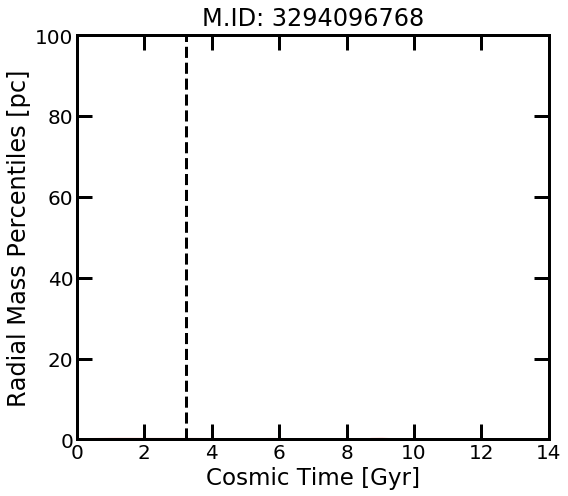

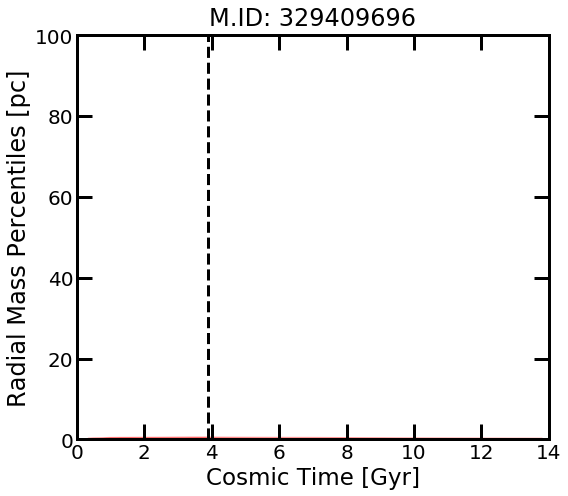

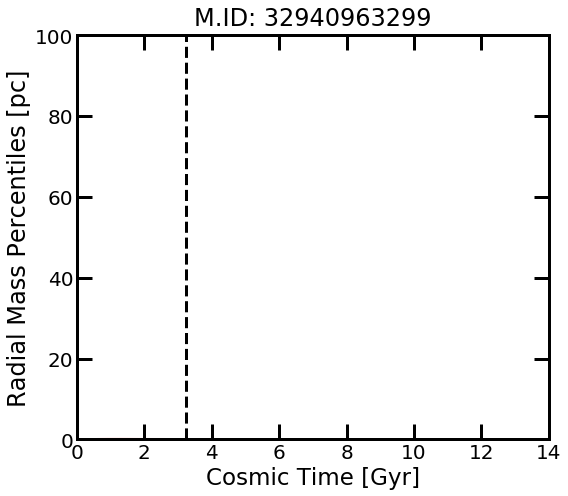

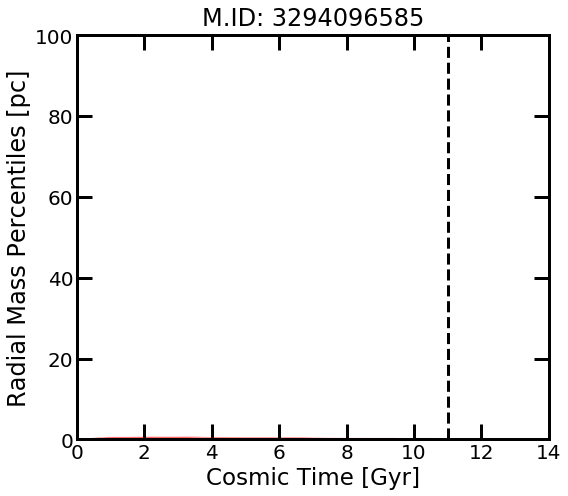

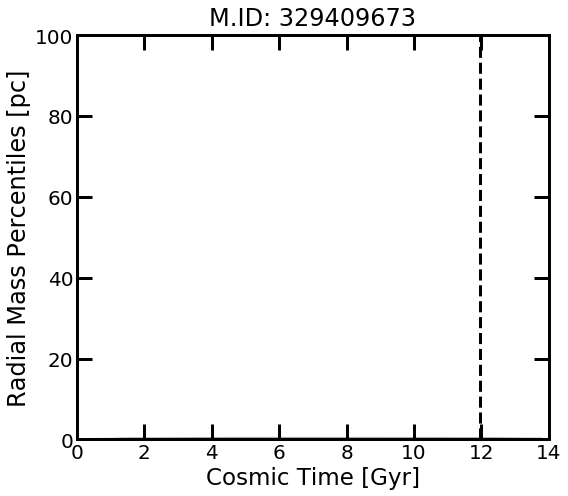

...

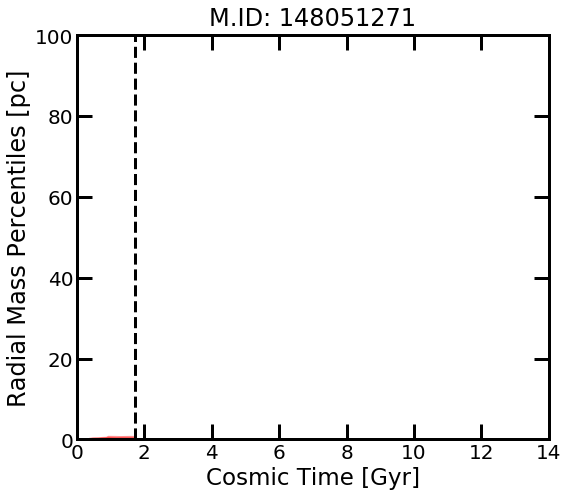

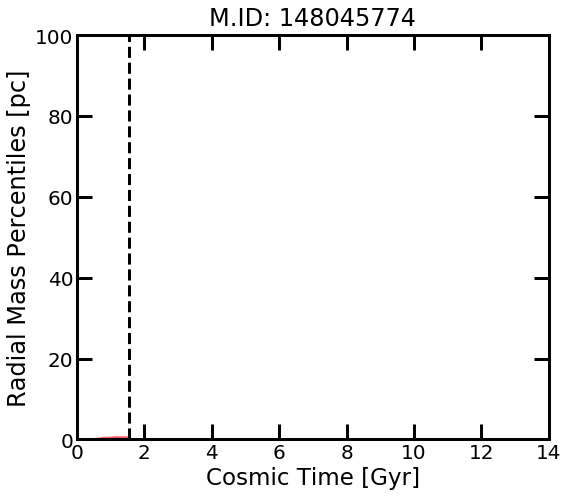

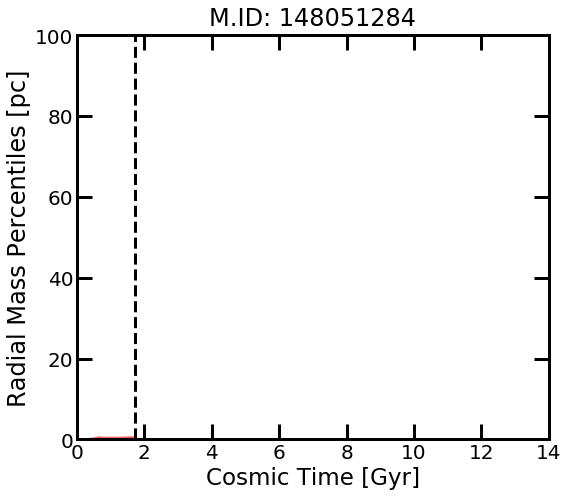

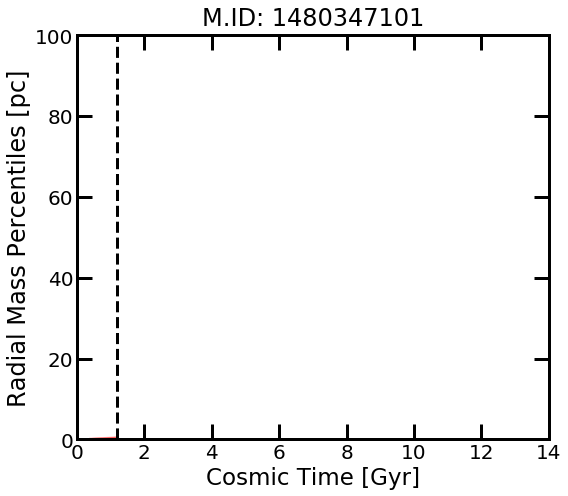

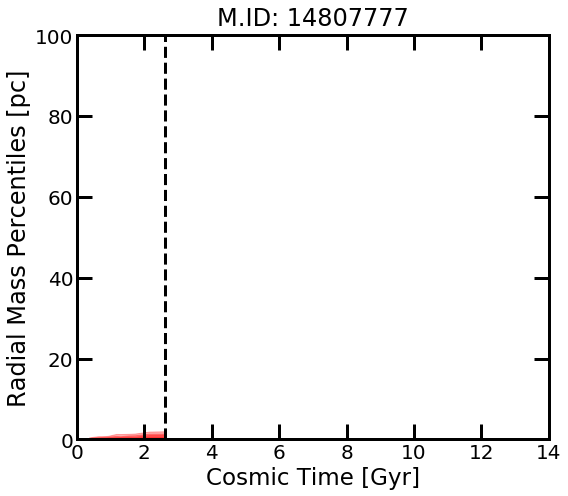

In [11]:
data=pd.read_csv('Mint_Data/Data100.csv')
ids=data['ID'].to_numpy()
t_infall=data['time_infall'].to_numpy()

for idx in ids:
    t, profile=get_mass_profiles(ID=idx, ptcl='D', resolution='Mint')
    
    fig, ax1 = plt.subplots(1, 1, sharex='none', sharey='none', figsize=(8, 7))
    # (ax1, ax2) = ax
    fig.set_facecolor('w')
    # fig.set_dpi(150.0)
    np.seterr(divide='ignore')

    linx=np.linspace(0, 14, 100)
    cm = plt.cm.get_cmap('viridis')
    # Increase weight of axes
    plt.setp(ax1.spines.values(), linewidth=3)
    # plt.setp(ax2.spines.values(), linewidth=3)
    # fig.set_dpi(150)

    for i in range(0, 4):
        which=profile[:,i]
        ax1.fill_between(t, [0]*len(t), which*1000, alpha=0.3, color='red')
        
    ax1.axvline(t_infall[ids==idx], ls='--', lw=3, c='k')
    ax1.set_xlim(0, 14)
    ax1.set_ylim(0, 100)
    # ax1.set_yscale('log')
    # ax1.legend(loc='lower right', fontsize=20, frameon=True, framealpha=0.4)
    ax1.tick_params(which='major', length=15, width=3, labelsize=15)
    ax1.tick_params(which='minor', length=8, width=2, labelsize=15)
    ax1.tick_params(direction='in', which='both', labelsize=20, bottom=True, top=True, left=True, right=True)
    ax1.set_title('M.ID: '+str(idx), fontsize=24, pad=10)
    ax1.set_xlabel('Cosmic Time [Gyr]', fontsize=23)
    ax1.set_ylabel('Radial Mass Percentiles [pc]', fontsize=24)

    fig.tight_layout()